<a href="https://colab.research.google.com/github/Davron030901/OpenCv/blob/main/17_Vehicle_and_Pedestrian_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Vehicle and Pedestrian Detection**

####**In this lesson we'll learn:**
1. Use a Haarcascade classier to detect Pedestrians
2. Use our Haarcascade classifiers on videos
3. Use a Haarcascade classier to detect Vehicles or cars


In [ ]:
# Our Setup, Import Libaries, Create our Imshow Function and Download our Images
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Define our imshow function
def imshow(title = "Image", image = None, size = 10):
    w, h = image.shape[0], image.shape[1]
    aspect_ratio = w/h
    plt.figure(figsize=(size * aspect_ratio,size))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.show()

#### **Testing on a Single Frame from our Video**

In [ ]:
# Create our video capturing object
cap = cv2.VideoCapture('walk.mp4')

# Load our body classifier
body_classifier = cv2.CascadeClassifier('haarcascade_fullbody.xml')

# Read first frame
ret, frame = cap.read()

# Ret is True if successfully read
if ret:

  #Grayscale our image for faster processing
  gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

  # Pass frame to our body classifier
  bodies = body_classifier.detectMultiScale(gray, 1.6, 6)

  # Extract bounding boxes for any bodies identified
  for (x,y,w,h) in bodies:
      cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 255), 2)

# Release our video capture
cap.release()
imshow("Pedestrian Detector", frame)

SystemError: <class 'cv2.CascadeClassifier'> returned a result with an exception set

#### **Testing on our 15 second clip**

**NOTE**: Takes around 1 minute to run.

We use cv2.VideoWriter to save the output as an AVI file.

```cv2.VideoWriter(video_output.avi, cv2.VideoWriter_fourcc('M','J','P','G'), FPS, (width, height))```

Formats can be:
- 'M','J','P','G' or MJPG
- MP4V
- X264
- avc1
- XVID



In [ ]:
body_detector = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_fullbody.xml')

In [ ]:
!wget https://github.com/opencv/opencv/blob/master/data/haarcascades/haarcascade_fullbody.xml -O haarcascade_fullbody.xml

--2024-11-18 16:15:49--  https://github.com/opencv/opencv/blob/master/data/haarcascades/haarcascade_fullbody.xml
Resolving github.com (github.com)... 140.82.121.3
Connecting to github.com (github.com)|140.82.121.3|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘haarcascade_fullbody.xml’

haarcascade_fullbod     [ <=>                ]   1.49M  --.-KB/s    in 0.05s   

2024-11-18 16:15:50 (29.3 MB/s) - ‘haarcascade_fullbody.xml’ saved [1558974]



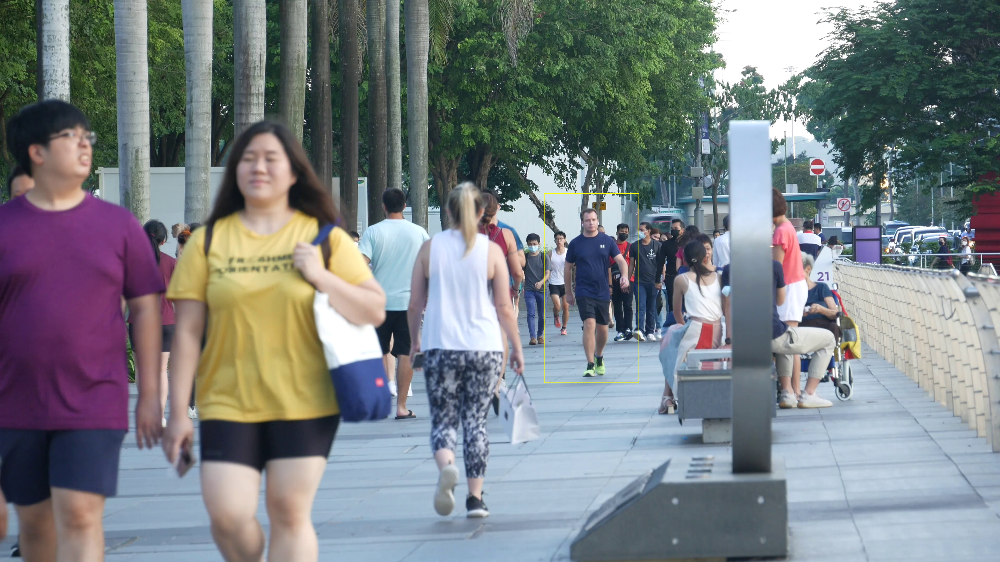

In [ ]:
import cv2
from google.colab.patches import cv2_imshow  # Import the colab-specific imshow function

# Create our video capturing object
cap = cv2.VideoCapture('walk.mp4')

# Check if video opened successfully
if not cap.isOpened():
    print("Error: Could not open video.")
    exit()

# Get the height and width of the frame
w = int(cap.get(3))  # Width of the frame
h = int(cap.get(4))  # Height of the frame

# Define the codec and create VideoWriter object
out = cv2.VideoWriter('walking_output.avi', cv2.VideoWriter_fourcc(*'XVID'), 30, (w, h))

# Load the body classifier (ensure it loads correctly from OpenCV's pre-installed path)
body_detector = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_fullbody.xml')

# Check if the classifier is loaded successfully
if body_detector.empty():
    print("Error: Could not load body detector.")
    exit()

# Loop once video is successfully loaded
while True:
    ret, frame = cap.read()

    if not ret:
        print("End of video or error reading the frame.")
        break

    # Convert frame to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Pass frame to our body classifier
    bodies = body_detector.detectMultiScale(gray, 1.2, 3)

    # Extract bounding boxes for any bodies identified
    for (x, y, w, h) in bodies:
        cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 255), 2)

    # Write the frame into the output video file
    out.write(frame)

    # Optionally, display the frame using cv2_imshow for Colab
    cv2_imshow(frame)  # This works in Colab instead of cv2.imshow()

    # Press 'q' to exit the video window (optional, doesn't apply in Colab)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release resources
cap.release()
out.release()
cv2.destroyAllWindows()


## **Play Video within Colab**
Steps
1. Convert the AVI file to MP4 using FFMPEG
2. Load the HTML plugins in IPython
3. Display our HTML video player

In [ ]:
!ffmpeg -i /content/walking_output.avi walking_output.mp4 -y

In [ ]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open('walking_output.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

In [ ]:
HTML("""
<video controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

#### **Vehicle Detection on Single Image**

In [ ]:
# Create our video capturing object
cap = cv2.VideoCapture('car.mp4')

# Load our vehicle classifier
vehicle_detector = cv2.CascadeClassifier('haarcascade_car.xml')

# Read first frame
ret, frame = cap.read()

# Ret is True if successfully read
if ret:

  #Grayscale our image for faster processing
  gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

  # Pass frame to our body classifier
  vehicles = vehicle_detector.detectMultiScale(gray, 1.4, 2)

  # Extract bounding boxes for any bodies identified
  for (x,y,w,h) in vehicles:
      cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 255), 2)

# Release our video capture
cap.release()
imshow("Vehicle Detector", frame)

#### **Testing on our 15 second clip**

In [ ]:
# Create our video capturing object
cap = cv2.VideoCapture('car.mp4')

# Get the height and width of the frame (required to be an interfer)
w = int(cap.get(3))
h = int(cap.get(4))

# Define the codec and create VideoWriter object.The output is stored in 'outpy.avi' file.
out = cv2.VideoWriter('cars_output.avi', cv2.VideoWriter_fourcc('M','J','P','G'), 30, (w, h))

vehicle_detector = cv2.CascadeClassifier('Haarcascades/haarcascade_car.xml')

# Loop once video is successfully loaded
while(True):

  ret, frame = cap.read()
  if ret:

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Pass frame to our body classifier
    vehicles = vehicle_detector.detectMultiScale(gray, 1.2, 3)

    # Extract bounding boxes for any bodies identified
    for (x,y,w,h) in vehicles:
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 255), 2)

    # Write the frame into the file 'output.avi'
    out.write(frame)
  else:
      break

cap.release()
out.release()

In [ ]:
!ffmpeg -i /content/cars_output.avi cars_output.mp4 -y

In [ ]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open('cars_output.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

In [ ]:
HTML("""
<video controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)